# Setting Up Kaggle

In [1]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json
! kaggle datasets download -d balraj98/cityscapes-pix2pix-dataset

 88% 89.0M/101M [00:00<00:00, 124MB/s]
100% 101M/101M [00:00<00:00, 128MB/s] 


In [3]:
!unzip cityscapes-pix2pix-dataset.zip

Archive:  cityscapes-pix2pix-dataset.zip
  inflating: metadata.csv            
  inflating: train/1.jpg             
  inflating: train/10.jpg            
  inflating: train/100.jpg           
  inflating: train/1000.jpg          
  inflating: train/1001.jpg          
  inflating: train/1002.jpg          
  inflating: train/1003.jpg          
  inflating: train/1004.jpg          
  inflating: train/1005.jpg          
  inflating: train/1006.jpg          
  inflating: train/1007.jpg          
  inflating: train/1008.jpg          
  inflating: train/1009.jpg          
  inflating: train/101.jpg           
  inflating: train/1010.jpg          
  inflating: train/1011.jpg          
  inflating: train/1012.jpg          
  inflating: train/1013.jpg          
  inflating: train/1014.jpg          
  inflating: train/1015.jpg          
  inflating: train/1016.jpg          
  inflating: train/1017.jpg          
  inflating: train/1018.jpg          
  inflating: train/1019.jpg          
  inflati

# Importing Dependices

In [4]:
import torch
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
import os
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms 
from torchvision.utils import save_image
from PIL import Image
from glob import glob 
import pickle
from torch import optim

In [5]:
from typing import List, Tuple, Dict
from statistics import mean 
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [6]:
device="cuda" if torch.cuda.is_available() else "cpu"

In [7]:
device

'cuda'

# Get Data

In [23]:
def show_img_sample(img: torch.Tensor, img1: torch.Tensor):
    fig, axes = plt.subplots(1, 2, figsize=(15, 8))
    ax = axes.ravel()
    ax[0].imshow(img.permute(1, 2, 0))
    ax[0].set_xticks([])
    ax[0].set_yticks([])
    ax[0].set_title("input image", c="g")
    ax[1].imshow(img1.permute(1, 2, 0))
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    ax[1].set_title("label image", c="g")
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

In [27]:
TRAIN_DIR = "train"
VAL_DIR = "val"

both_transform = A.Compose(
    [A.Resize(width=256, height=256),], 
    additional_targets={"image0": "image"},
)

transform_only_input = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        # A.ColorJitter(p=0.2),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

transform_only_mask = A.Compose(
    [
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

In [21]:
class MapDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.list_files = os.listdir(self.root_dir)

    def __len__(self):
        return len(self.list_files)

    def __getitem__(self, index):
        img_file = self.list_files[index]
        img_path = os.path.join(self.root_dir, img_file)
        image = np.array(Image.open(img_path))
        input_image = image[:, :256, :]
        target_image = image[:, 256:, :]

        augmentations = both_transform(image=input_image, image0=target_image)
        input_image = augmentations["image"]
        target_image = augmentations["image0"]

        input_image = transform_only_input(image=input_image)["image"]
        target_image = transform_only_mask(image=target_image)["image"]

        return input_image, target_image

In [24]:
dataset = MapDataset("train/")
loader = DataLoader(dataset, batch_size=5)

In [25]:
x,y=dataset.__getitem__(10)

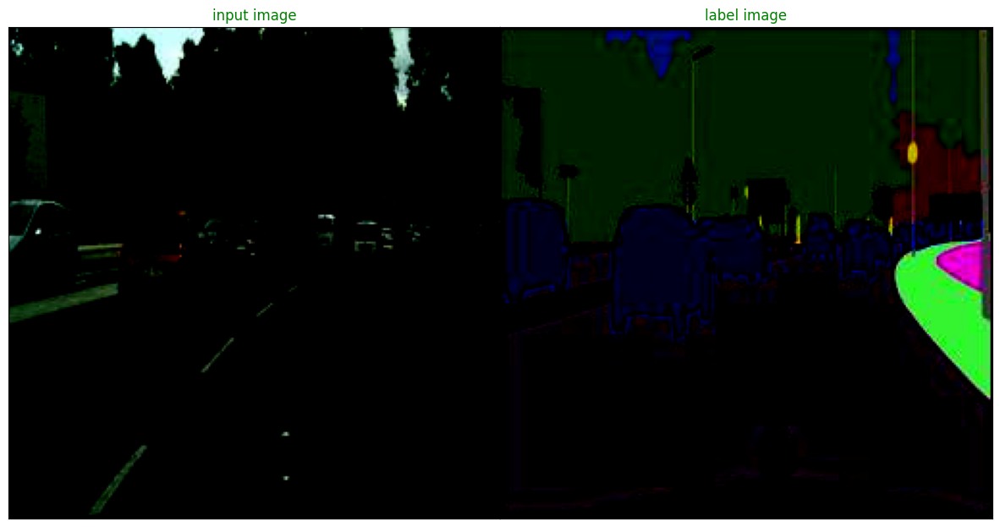

In [26]:
show_img_sample(x,y)

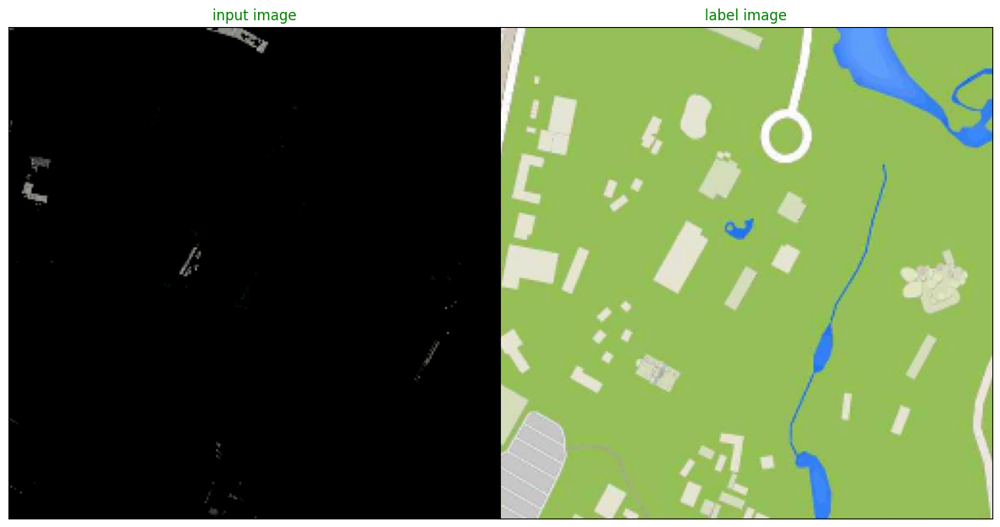

In [ ]:
show_img_sample(x,y)

In [ ]:
# plt.imshow(y.permute(1,2,0))

# Discriminator Model

In [28]:
# from torch.nn.modules.activation import LeakyReLU
class ConvBlock(nn.Module):
  def __init__(self,in_channels,out_channels,stride=2):
    super().__init__()
    self.conv_layer=nn.Sequential(
        nn.Conv2d(in_channels,out_channels,4,stride,bias=False,padding_mode='reflect'),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2)
    )
  def forward(self,x):
    return self.conv_layer(x)

In [29]:
class Discriminator(nn.Module):
  def __init__(self,
               in_channels=3):
    super().__init__()
    self.model=nn.Sequential(
        nn.Conv2d(in_channels*2,64,kernel_size=4,stride=2,padding_mode="reflect",),
        nn.LeakyReLU(0.2),
        ConvBlock(64,128,stride=2),
        ConvBlock(128,256,stride=2),
        ConvBlock(256,512,stride=1),
        nn.Conv2d(512,1,kernel_size=4,stride=1,padding=1,padding_mode="reflect"),
        nn.Sigmoid()
    )
  def forward(self,x,y):
    x=torch.cat([x,y],dim=1)
    return self.model(x)

In [30]:
def test():
    x = torch.randn((1, 3, 256, 256))
    y = torch.randn((1, 3, 256, 256))
    model = Discriminator(in_channels=3)
    preds = model(x, y)
    print(model)
    print(preds.shape)

In [31]:
# test()

# Generator Model

In [32]:
class Block(nn.Module):
  def __init__(self,in_channels,out_channels,down=True,act="relu",use_dropout=False):
    super().__init__()
    self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, 2, 1, bias=False, padding_mode="reflect")
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU() if act == "relu" else nn.LeakyReLU(0.2),
        )
    self.use_dropout=use_dropout
    self.dropout=nn.Dropout(0.5)
  def forward(self,x):
    x=self.conv(x)
    return self.dropout(x) if self.use_dropout else x

In [33]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, features=64):
        super().__init__()
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, 4, 2, 1, padding_mode="reflect"),
            nn.LeakyReLU(0.2),
        )
        self.down1 = Block(features, features * 2, down=True, act="leaky", use_dropout=False)
        self.down2 = Block(
            features * 2, features * 4, down=True, act="leaky", use_dropout=False
        )
        self.down3 = Block(
            features * 4, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down4 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down5 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.down6 = Block(
            features * 8, features * 8, down=True, act="leaky", use_dropout=False
        )
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 4, 2, 1), nn.ReLU()
        )

        self.up1 = Block(features * 8, features * 8, down=False, act="relu", use_dropout=True)
        self.up2 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up3 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=True
        )
        self.up4 = Block(
            features * 8 * 2, features * 8, down=False, act="relu", use_dropout=False
        )
        self.up5 = Block(
            features * 8 * 2, features * 4, down=False, act="relu", use_dropout=False
        )
        self.up6 = Block(
            features * 4 * 2, features * 2, down=False, act="relu", use_dropout=False
        )
        self.up7 = Block(features * 2 * 2, features, down=False, act="relu", use_dropout=False)
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, in_channels, kernel_size=4, stride=2, padding=1),
            nn.Tanh(),
        )

    def forward(self, x):
        d1 = self.initial_down(x)
        d2 = self.down1(d1)
        d3 = self.down2(d2)
        d4 = self.down3(d3)
        d5 = self.down4(d4)
        d6 = self.down5(d5)
        d7 = self.down6(d6)
        bottleneck = self.bottleneck(d7)
        up1 = self.up1(bottleneck)
        up2 = self.up2(torch.cat([up1, d7], 1))
        up3 = self.up3(torch.cat([up2, d6], 1))
        up4 = self.up4(torch.cat([up3, d5], 1))
        up5 = self.up5(torch.cat([up4, d4], 1))
        up6 = self.up6(torch.cat([up5, d3], 1))
        up7 = self.up7(torch.cat([up6, d2], 1))
        return self.final_up(torch.cat([up7, d1], 1))

In [34]:
def test():
    x = torch.randn((1, 3, 256, 256))
    model = Generator(in_channels=3,features=64)
    preds = model(x)
    print(preds.shape)

In [35]:
# test()

# Training the Model

In [36]:
LEARNING_RATE = 2e-4
BATCH_SIZE = 16
NUM_WORKERS = 2
IMAGE_SIZE = 256
CHANNELS_IMG = 3
L1_LAMBDA = 100
LAMBDA_GP = 10
NUM_EPOCHS = 500
LOAD_MODEL = False
SAVE_MODEL = False
CHECKPOINT_DISC = "disc.pth.tar"
CHECKPOINT_GEN = "gen.pth.tar"

In [37]:
g_loss=[]
d_loss=[]

In [38]:
def save_some_examples(gen, val_loader, epoch, folder):
    x, y = next(iter(val_loader))
    x, y = x.to(device), y.to(device)
    gen.eval()
    with torch.no_grad():
        y_fake = gen(x)
        y_fake = y_fake * 0.5 + 0.5  # remove normalization#
        save_image(y_fake, folder + f"/y_gen_{epoch}.png")
        save_image(x * 0.5 + 0.5, folder + f"/input_{epoch}.png")
        save_image(y * 0.5 + 0.5, folder + f"/label_{epoch}.png")
    gen.train()

In [39]:
def train_fn(
    disc, gen, loader, opt_disc, opt_gen, l1_loss, bce, g_scaler, d_scaler,
):
    loop = tqdm(loader, leave=True)
    total_g_loss=0
    total_d_loss=0
    for idx, (x, y) in enumerate(loop):
        x = x.to(device)
        y = y.to(device)

        # Train Discriminator
        with torch.cuda.amp.autocast():
            y_fake = gen  (x)
            D_real = disc(x, y)
            D_real_loss = bce(D_real, torch.ones_like(D_real))
            D_fake = disc(x, y_fake.detach())
            D_fake_loss = bce(D_fake, torch.zeros_like(D_fake))
            D_loss = (D_real_loss + D_fake_loss) / 2
            total_d_loss+=D_loss.item()

        disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Train generator
        with torch.cuda.amp.autocast():
            D_fake = disc(x, y_fake)
            G_fake_loss = bce(D_fake, torch.ones_like(D_fake))
            L1 = l1_loss(y_fake, y) * L1_LAMBDA
            G_loss = G_fake_loss + L1
            total_g_loss+=G_loss.item()
            # g_loss.append(G_loss.item())

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 10 == 0:
            loop.set_postfix(
                D_real=torch.sigmoid(D_real).mean().item(),
                D_fake=torch.sigmoid(D_fake).mean().item(),
                G_loss=torch.sigmoid(G_loss).mean().item(),
            )
    return total_d_loss,total_g_loss 

In [40]:
def evaluate(NUM_EPOCHS):
  
  root = "evaluation"
  fig, axes = plt.subplots(50, 3, figsize=(18, 140))
  
  # ax = axes.ravel()
  # print(ax.shape)
  root="evaluation"
  ax_n=0
  for i in range(500):
    if i%10==0:
      x_file=os.path.join(root,f"input_{str(i)}.png")
      y_file=os.path.join(root,f"label_{str(i)}.png")
      y_pred_file=os.path.join(root,f"y_gen_{str(i)}.png")
      axes[ax_n,0].imshow(Image.open(x_file))
      axes[ax_n,0].set_xticks([])
      axes[ax_n,0].set_yticks([])
      axes[ax_n,0].set_title("Input image", c="g")
      axes[ax_n,1].imshow(Image.open(y_file))
      axes[ax_n,1].set_xticks([])
      axes[ax_n,1].set_yticks([])
      axes[ax_n,1].set_title("Label Image", c="g")
      axes[ax_n,2].imshow(Image.open(y_pred_file))
      axes[ax_n,2].set_xticks([])
      axes[ax_n,2].set_yticks([])
      axes[ax_n,2].set_title("Generated Image", c="g")
      ax_n+=1

In [41]:
import numpy as np

def show_losses(g, d):
    g = np.array(g)
    d = np.array(d)
    fig, axes = plt.subplots(1, 2, figsize=(15,6))
    ax = axes.ravel()
    ax[0].plot(np.arange(len(g)).tolist(), g)
    ax[0].set_title("Generator Loss")
    ax[1].plot(np.arange(len(d)).tolist(), d)
    ax[1].set_title("Discriminator Loss")
    plt.show()


In [42]:
# def train_show_img(name, G):
# #     G = load_model(name)
#     root = "evaluation"
#     fig, axes = plt.subplots(int(name), 1, figsize=(12, 18))
#     ax = axes.ravel()
#     for i in range(int(name)):
#         filename = os.path.join(root, f"y_gen_{str(i+1)}.png")
#         ax[i].imshow(Image.open(filename))
#         ax[i].set_xticks([])
#         ax[i].set_yticks([])

In [43]:
disc = Discriminator(in_channels=3).to(device)
gen = Generator(in_channels=3, features=64).to(device)
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999),)
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
BCE = nn.BCEWithLogitsLoss()
L1_LOSS = nn.L1Loss()

In [44]:
train_dataset = MapDataset(root_dir=TRAIN_DIR)
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
)

In [45]:
g_scaler = torch.cuda.amp.GradScaler()
d_scaler = torch.cuda.amp.GradScaler()
val_dataset = MapDataset(root_dir=VAL_DIR)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

In [46]:
for epoch in range(NUM_EPOCHS):
    print("EPOCH",epoch+1)
    D_loss,G_loss=train_fn(
        disc, gen, train_loader, opt_disc, opt_gen, L1_LOSS, BCE, g_scaler, d_scaler,
    )
    d_loss.append(D_loss/69)
    g_loss.append(G_loss/69)
    # if epoch%10==0:
    #   train_show_img(5, gen)
    # if config.SAVE_MODEL and epoch % 5 == 0:
    #     save_checkpoint(gen, opt_gen, filename=config.CHECKPOINT_GEN)
    #     save_checkpoint(disc, opt_disc, filename=config.CHECKPOINT_DISC)
    save_some_examples(gen, val_loader, epoch, folder="evaluation")

EPOCH 1


100%|██████████| 186/186 [00:39<00:00,  4.72it/s, D_fake=0.5, D_real=0.708, G_loss=1]


FileNotFoundError: ignored

In [ ]:
# for epoch in range(10):
#     print("EPOCH",epoch+1)
#     train_fn(
#         disc, gen, train_loader, opt_disc, opt_gen, L1_LOSS, BCE, g_scaler, d_scaler,
#     )
#     # if epoch%10==0:
#     #   train_show_img(5, gen)
#     # if config.SAVE_MODEL and epoch % 5 == 0:
#     #     save_checkpoint(gen, opt_gen, filename=config.CHECKPOINT_GEN)
#     #     save_checkpoint(disc, opt_disc, filename=config.CHECKPOINT_DISC)
#     save_some_examples(gen, val_loader, epoch, folder="evaluation2")

In [ ]:
show_losses(g_loss,d_loss)

In [ ]:
show_losses(g_loss,d_loss)

In [ ]:
def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)

In [ ]:
save_checkpoint(gen, opt_gen, filename=CHECKPOINT_GEN)
save_checkpoint(disc, opt_disc, filename=CHECKPOINT_DISC)

In [ ]:
def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=device)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # If we don't do this then it will just have learning rate of old checkpoint
    # and it will lead to many hours of debugging \:
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

# Evaluation

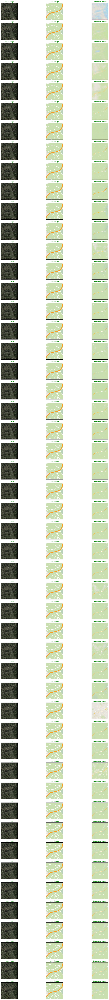

In [ ]:
evaluate(NUM_EPOCHS)

# Gradio App

In [ ]:
gen.to("cpu")

Generator(
  (initial_down): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), padding_mode=reflect)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (down1): Block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (down2): Block(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, padding_mode=reflect)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (dropout): Dropout(p=0.5, inplace=False)
  )
  (down3): Block(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False, pa

In [ ]:
next(iter(gen.parameters())).device

device(type='cpu')

In [ ]:
transforms = A.Compose(
    [
        A.Resize(width=256, height=256),
        # A.HorizontalFlip(p=0.5),
        # A.ColorJitter(p=0.2),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        ToTensorV2(),
    ]
)

In [ ]:
import torchvision.transforms as T
to_img=T.ToPILImage()

In [ ]:
def predict(img):
  # Apply Transformations
  img=np.array(img)
  img=transforms(image=img)
  img=img['image'].unsqueeze(0)
  # Predict
  gen.eval()
  with torch.inference_mode():
    y_gen=gen(img)
  y_gen=y_gen[0]
  y_gen=to_img(y_gen)
  return y_gen

In [ ]:
image_path = Image.open("evaluation/input_0.png")

In [ ]:
out=predict(image_path)

In [ ]:
examples=['maps/maps/val/140.jpg','maps/maps/val/150.jpg','maps/maps/val/14.jpg','maps/maps/val/11.jpg']

In [ ]:
# out.shape

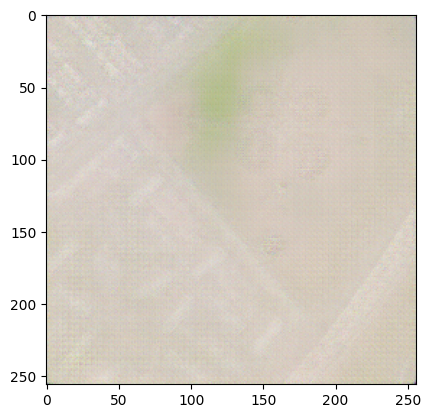

In [ ]:
# plt.imshow(out.permute(1,2,0))

In [ ]:
try:
    import gradio as gr
except: 
    !pip -q install gradio
    import gradio as gr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 286.7/286.7 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.6/135.6 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 56.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 18.6 MB/s eta 0

In [ ]:
import gradio as gr
title="Pix2Pix GAN"
description="This is a Sattelite Image to Map converter"

demo=gr.Interface(fn=predict,
                  inputs=gr.Image(type='pil'),
                  outputs=gr.Image(type='pil'),
                  title=title ,
                  examples=examples,
                  description=description)

In [ ]:
demo.launch(debug=False,
            share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://7143fbd48f51f4fb33.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades (NEW!), check out Spaces: https://huggingface.co/spaces


In [47]:
!pip install transformers
!pip install gradio
!pip install huggan

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 58.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 79.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 19.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 89.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 137.2/137.2 kB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.0/57.0 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [48]:
import gradio as gr
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from PIL import Image
from torchvision.utils import save_image
from huggan.pytorch.pix2pix.modeling_pix2pix import GeneratorUNet
	
transform = Compose(
    [
       Resize((256, 256), Image.BICUBIC),
       ToTensor(),
       Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
  ]
)
model = GeneratorUNet.from_pretrained('huggan/pix2pix-cityscapes')

def predict_fn(img):
  inp = transform(img).unsqueeze(0)
  out = model(inp)
  save_image(out, 'out.png', normalize=True)
  return 'out.png'
	
gr.Interface(predict_fn, inputs=gr.inputs.Image(type='pil'), outputs='image', examples=[['img.png'], ['real.jpeg'], ['real2.jpg']]).launch()

ModuleNotFoundError: ignored